# Comparison of various attack on robust models 
- included: FMN, ALMA, APGD, DDN, PDGD, PDPGD

In [40]:
from logging_ import Logger
import matplotlib.pyplot as plt
import pandas as pd

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [175]:
logger = Logger(logs_dir="logs")

In [176]:
logger.load_all()

# Metrics

In [44]:
report = logger.report()
report.reset_index(drop=True)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/logging_.py:205: RuntimeWarning: Mean of empty slice
  first_last_ratio = np.nanmean(first_to_final_ratio(step_norms, step_accs))


,dataset,norm,model,attack,steps,params,median,n_qs,asr,first_adv_step,first_last_ratio
0,CIFAR10,L2,Engstrom2019Robustness_l2,ddn,101,-init_norm-1.0-loss_f-DL-steps-100-γ-0.05,0.844558,7.0,100.000000,5.395000,2.104891
1,CIFAR10,Linf,Rade2021Helper_R18_extra,aa,2,-eps-0.031373-loss_f-DL,inf,0.0,30.167598,0.720000,1.000000
2,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_ddpm,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,1.155422,21.0,100.000000,2.365000,2.847995
3,CIFAR10,Linf,Engstrom2019Robustness_linf,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,0.035818,13.0,100.000000,2.805000,1.510797
4,CIFAR10,L1,Engstrom2019Robustness_l2,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,9.856852,37.0,92.307692,4.413978,1.721132
...,...,...,...,...,...,...,...,...,...,...,...
560,CIFAR10,L2,Engstrom2019Robustness_l2,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,0.861675,12.0,100.000000,2.505000,1.462932
561,CIFAR10,L2,Rade2021Helper_R18_ddpm,ddn,101,-init_norm-0.1-loss_f-DL-steps-100-γ-0.05,1.115903,52.0,98.360656,47.137056,1.094957
562,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_ddpm,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,1.162410,20.0,100.000000,2.365000,2.423134
563,CIFAR10,L1,Engstrom2019Robustness_l2,apgd,1021,-binary_search_steps-10-loss_f-DL-max_eps-12.0...,8.953124,337.0,89.560439,80.685083,inf


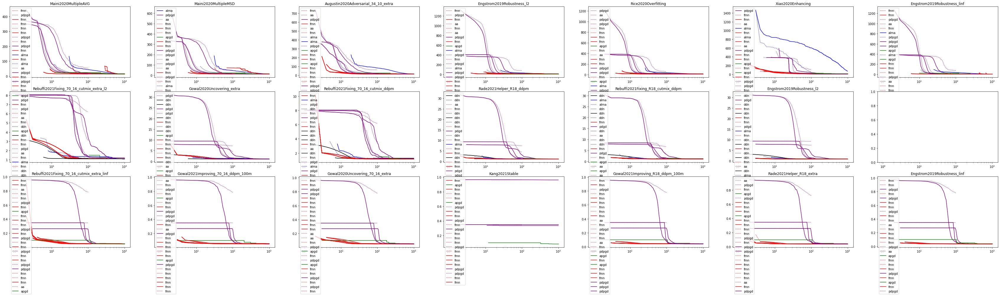

In [45]:
logger.plot_QD_grid(figsize=(60,15))

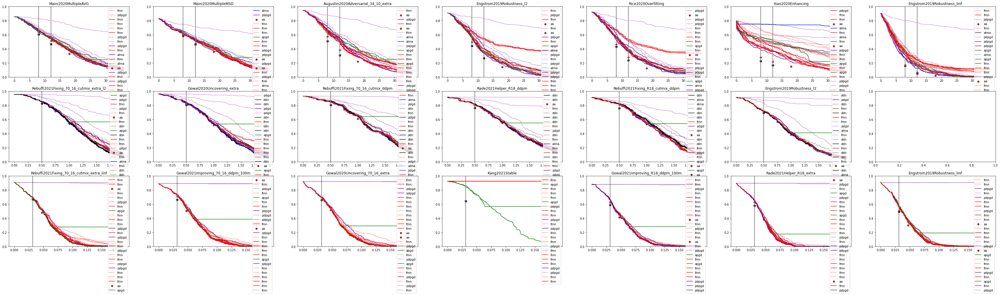

In [46]:
logger.plot_SE_grid(figsize=(60,15))

# Interpretation

## Linf

In [47]:
report = logger.report(logger.where(norm="Linf"))
report.reset_index(drop=True)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/logging_.py:205: RuntimeWarning: Mean of empty slice
  first_last_ratio = np.nanmean(first_to_final_ratio(step_norms, step_accs))
/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/utils/metrics.py:109: RuntimeWarning: divide by zero encountered in float_scalars


,dataset,norm,model,attack,steps,params,median,n_qs,asr,first_adv_step,first_last_ratio
0,CIFAR10,Linf,Rade2021Helper_R18_extra,aa,2,-eps-0.031373-loss_f-DL,inf,0.0,30.167598,0.720000,1.000000
1,CIFAR10,Linf,Engstrom2019Robustness_linf,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,0.035818,13.0,100.000000,2.805000,1.510797
2,CIFAR10,Linf,Kang2021Stable,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,inf,0.0,0.000000,0.000000,NaN
3,CIFAR10,Linf,Kang2021Stable,apgd,1021,-binary_search_steps-10-loss_f-DL-max_eps-0.1-...,0.083008,329.0,98.918919,70.181818,inf
4,CIFAR10,Linf,Gowal2021Improving_R18_ddpm_100m,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,0.041879,24.0,100.000000,3.690000,2.063747
...,...,...,...,...,...,...,...,...,...,...,...
175,CIFAR10,Linf,Kang2021Stable,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,inf,0.0,0.000000,0.000000,NaN
176,CIFAR10,Linf,Gowal2021Improving_R18_ddpm_100m,pdpgd,1001,-loss_f-DL-num_steps-1000-primal_lr-0.01-rando...,0.043545,190.0,100.000000,3.610000,inf
177,CIFAR10,Linf,Engstrom2019Robustness_linf,pdpgd,101,-loss_f-DL-num_steps-100-primal_lr-1.0-random_...,0.780100,59.0,100.000000,1.685000,0.963603
178,CIFAR10,Linf,Rade2021Helper_R18_extra,pdpgd,1001,-loss_f-DL-num_steps-1000-primal_lr-1.0-random...,0.041880,121.0,100.000000,1.550000,inf


## Best params results

In [48]:
report.groupby(["model", "attack"])["median"].min()

model                                      attack
Engstrom2019Robustness_linf                aa        0.047059
                                           apgd      0.036563
                                           fmn       0.034966
                                           pdpgd     0.034759
Gowal2020Uncovering_70_16_extra            aa             inf
                                           apgd      0.050031
                                           fmn       0.049296
                                           pdpgd     0.050486
Gowal2021Improving_70_16_ddpm_100m         aa             inf
                                           apgd      0.054688
                                           fmn       0.050779
                                           pdpgd     0.049835
Gowal2021Improving_R18_ddpm_100m           aa        0.047059
                                           apgd      0.043313
                                           fmn       0.040978
                    

In [49]:
report.groupby(["attack", "model"])["n_qs"].min()

attack  model                                    
aa      Engstrom2019Robustness_linf                    0.0
        Gowal2020Uncovering_70_16_extra                0.0
        Gowal2021Improving_70_16_ddpm_100m             0.0
        Gowal2021Improving_R18_ddpm_100m               0.0
        Rade2021Helper_R18_extra                       0.0
        Rebuffi2021Fixing_70_16_cutmix_extra_linf      0.0
apgd    Engstrom2019Robustness_linf                  219.0
        Gowal2020Uncovering_70_16_extra              330.0
        Gowal2021Improving_70_16_ddpm_100m           247.0
        Gowal2021Improving_R18_ddpm_100m             314.0
        Kang2021Stable                                 0.0
        Rade2021Helper_R18_extra                     310.0
        Rebuffi2021Fixing_70_16_cutmix_extra_linf    126.0
fmn     Engstrom2019Robustness_linf                    9.0
        Gowal2020Uncovering_70_16_extra               19.0
        Gowal2021Improving_70_16_ddpm_100m            15.0
      

In [50]:
report.groupby(["attack", "model"])["asr"].max()

attack  model                                    
aa      Engstrom2019Robustness_linf                   66.850829
        Gowal2020Uncovering_70_16_extra               44.021738
        Gowal2021Improving_70_16_ddpm_100m            43.258429
        Gowal2021Improving_R18_ddpm_100m              53.409091
        Rade2021Helper_R18_extra                      57.541901
        Rebuffi2021Fixing_70_16_cutmix_extra_linf     46.961325
apgd    Engstrom2019Robustness_linf                  100.000000
        Gowal2020Uncovering_70_16_extra              100.000000
        Gowal2021Improving_70_16_ddpm_100m           100.000000
        Gowal2021Improving_R18_ddpm_100m             100.000000
        Kang2021Stable                                98.918919
        Rade2021Helper_R18_extra                     100.000000
        Rebuffi2021Fixing_70_16_cutmix_extra_linf    100.000000
fmn     Engstrom2019Robustness_linf                  100.000000
        Gowal2020Uncovering_70_16_extra              1

## Curves in Linf

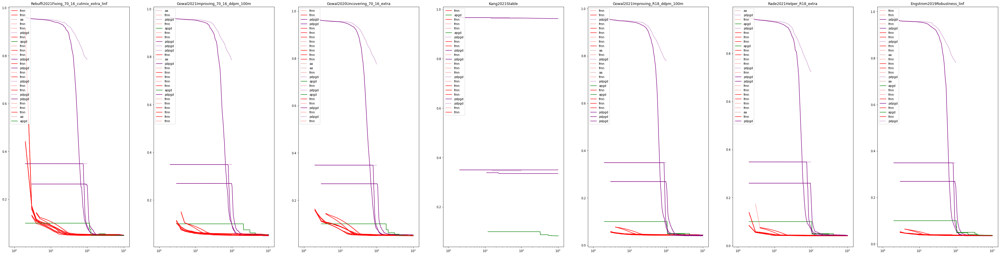

In [67]:
logger.plot_QD_grid(where_settings={"norm":"Linf"}, figsize=(60,15))

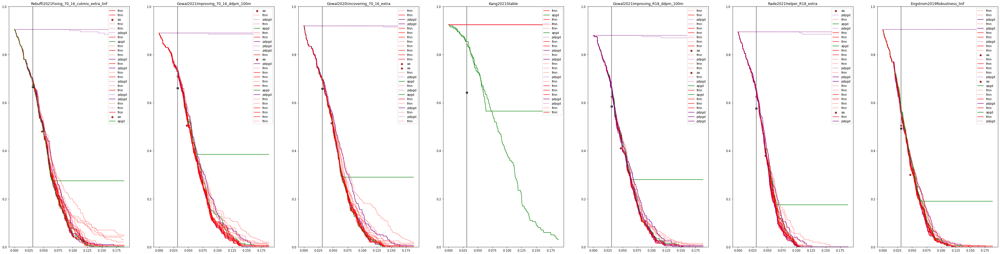

In [70]:
logger.plot_SE_grid(where_settings={"norm":"Linf"}, figsize=(60,15))

### FMN inspection

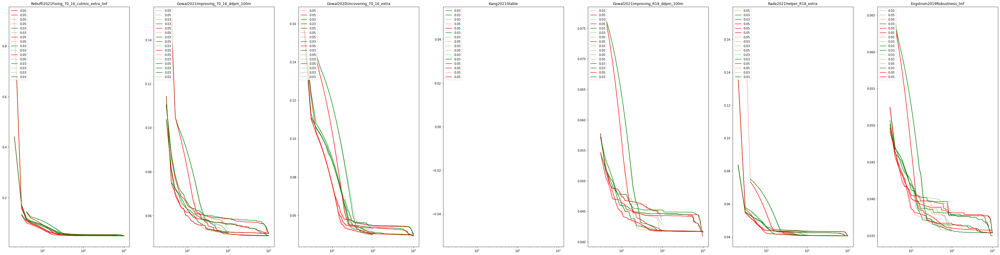

In [68]:
logger.plot_QD_grid(where_settings={"norm":"Linf"}, figsize=(60,15), compare_on="γ_init")

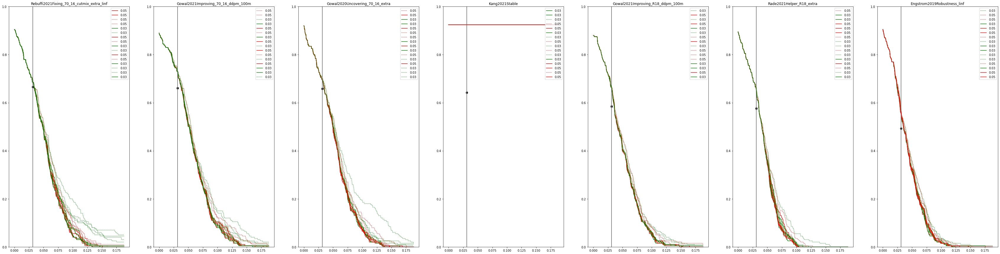

In [72]:
logger.plot_SE_grid(where_settings={"norm":"Linf"}, figsize=(60,15), compare_on="γ_init")

#### FMN Observation 
* gamma_init = 0.05 looks better

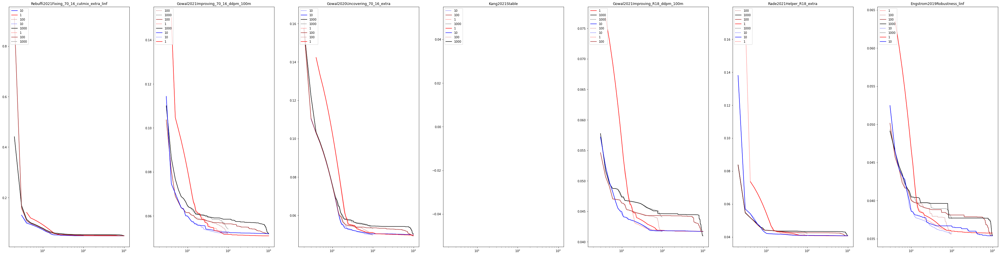

In [69]:
logger.plot_QD_grid(where_settings={"norm":"Linf", "γ_init":"0.05"}, figsize=(60,15), compare_on="α_init")

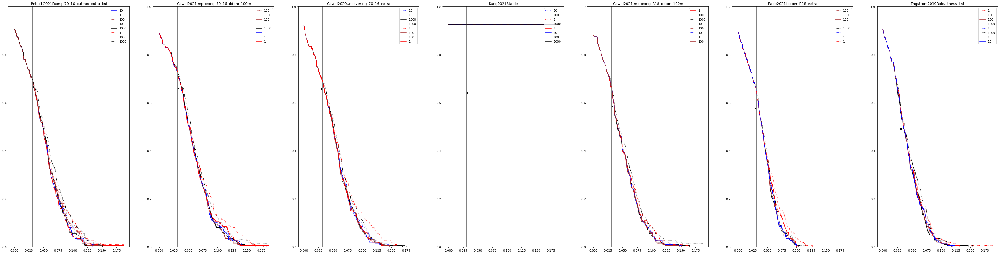

In [71]:
logger.plot_SE_grid(where_settings={"norm":"Linf", "γ_init":"0.05"}, figsize=(60,15), compare_on="α_init")

#### FMN Observation 
* alpha_init = aplha size changes behaviour, but it is unclear which alplha is the best.
* alpha = 10 selected a bit ad hoc
* **NOTE** that the situation at eps=8/255 is basically the same for all hypeparams and number of iterations

### PDPGD investigation 

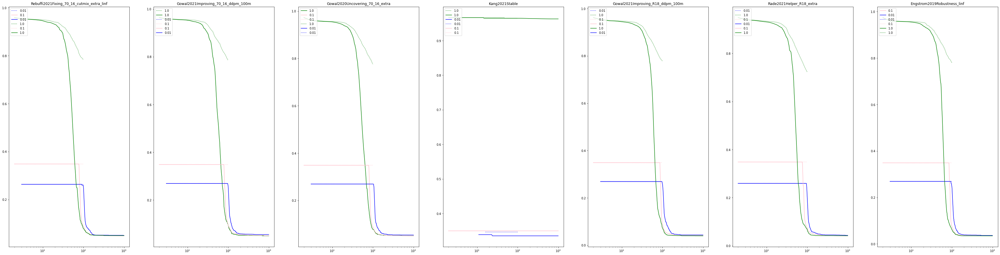

In [73]:
logger.plot_QD_grid(where_settings={"norm":"Linf"}, figsize=(60,15), compare_on="primal_lr")

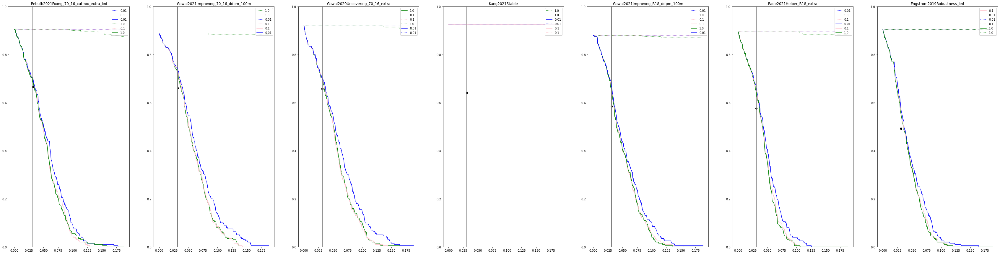

In [74]:
logger.plot_SE_grid(where_settings={"norm":"Linf"}, figsize=(60,15), compare_on="primal_lr")

#### PDPGD Observation 
* the 100 step runs were totally off - wrong hypers?
* primal_lr = 1 seems to be the best

## Comparison of FMN with best hyperarms and the other attacks

In [112]:
optimal_linf_settings = {"norm":"Linf", "γ_init":"0.05", "α_init":"10-", "primal_lr":"1", "max_eps":0.1}

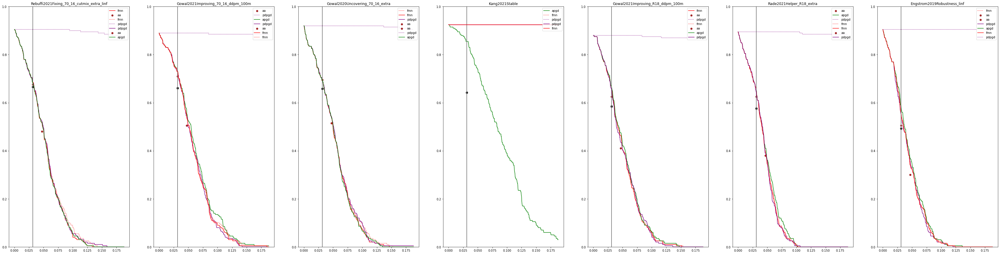

In [113]:
logger.plot_SE_grid(where_settings=optimal_linf_settings, figsize=(60,15))

## Observation of SE in Linf
- The robust bench robust accuracies are lower than those reached by my AA about 5-10 %
- 100 steps FMN seem to closely follow the 1000 steps FMN
- APGD only one able to cope with Kang stable
- FMN, min APGD, PGPDG attacks moreless the same


## Fair comparison (fixed hyperparams)

In [88]:
report = logger.report(logger.where(norm="Linf", α_init="10-", γ_init=0.05, primal_lr=1, max_eps=0.1))
report.reset_index(drop=True)
report = report[report.attack != "aa"]

# apgd step overflow hack
report.steps = report.steps.replace(1021, 1001)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/utils/metrics.py:109: RuntimeWarning: divide by zero encountered in float_scalars
/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/logging_.py:205: RuntimeWarning: Mean of empty slice
  first_last_ratio = np.nanmean(first_to_final_ratio(step_norms, step_accs))


In [89]:
report.attack.value_counts()

pdpgd    14
fmn      14
apgd      7
Name: attack, dtype: int64

In [90]:
# assure that all attacks has the same number of runs
# assert (report.attack.value_counts() == report.attack.value_counts()[0]).all()

## Fair params results

In [91]:
pd.DataFrame(report.groupby(["steps", "model", "attack"])["median"].min())

median
steps model                                     attack          
101   Engstrom2019Robustness_linf               fmn     0.035733
                                                pdpgd   0.780100
      Gowal2020Uncovering_70_16_extra           fmn     0.050001
                                                pdpgd   0.775751
      Gowal2021Improving_70_16_ddpm_100m        fmn     0.052019
                                                pdpgd   0.784435
      Gowal2021Improving_R18_ddpm_100m          fmn     0.041717
                                                pdpgd   0.779014
      Kang2021Stable                            fmn          inf
                                                pdpgd   0.964706
      Rade2021Helper_R18_extra                  fmn     0.040759
                                                pdpgd   0.723293
      Rebuffi2021Fixing_70_16_cutmix_extra_linf fmn     0.048588
                                                pdpgd   0.782787
1001  Engstrom2019Robustness_linf               apgd    0.037109
                                                fmn     0.035374
                                                pdpgd   0.034759
      Gowal2020Uncovering_70_16_extra           apgd    0.050098
                                                fmn     0.049776
                                                pdpgd   0.050868
      Gowal2021Improving_70_16_ddpm_100m        apgd    0.054688
                                                fmn     0.051932
                                                pdpgd   0.049835
      Gowal2021Improving_R18_ddpm_100m          apgd    0.043457
                                                fmn     0.041709
                                                pdpgd   0.039680
      Kang2021Stable                            apgd    0.083008
                                                fmn          inf
                                                pdpgd   0.962745
      Rade2021Helper_R18_extra                  apgd    0.041016
                                                fmn     0.040741
                                                pdpgd   0.041880
      Rebuffi2021Fixing_70_16_cutmix_extra_linf apgd    0.048438
                                                fmn     0.048344
                                                pdpgd   0.049423

In [92]:
pd.DataFrame(report.groupby(["steps", "attack", "model"])["n_qs"].min())

n_qs
steps attack model                                           
101   fmn    Engstrom2019Robustness_linf                  9.0
             Gowal2020Uncovering_70_16_extra             19.0
             Gowal2021Improving_70_16_ddpm_100m          15.0
             Gowal2021Improving_R18_ddpm_100m             8.0
             Kang2021Stable                               0.0
             Rade2021Helper_R18_extra                     8.0
             Rebuffi2021Fixing_70_16_cutmix_extra_linf   18.0
      pdpgd  Engstrom2019Robustness_linf                 59.0
             Gowal2020Uncovering_70_16_extra             58.0
             Gowal2021Improving_70_16_ddpm_100m          58.0
             Gowal2021Improving_R18_ddpm_100m            57.0
             Kang2021Stable                               2.0
             Rade2021Helper_R18_extra                    64.0
             Rebuffi2021Fixing_70_16_cutmix_extra_linf   57.0
1001  apgd   Engstrom2019Robustness_linf                380.0
             Gowal2020Uncovering_70_16_extra            412.0
             Gowal2021Improving_70_16_ddpm_100m         436.0
             Gowal2021Improving_R18_ddpm_100m           432.0
             Kang2021Stable                             329.0
             Rade2021Helper_R18_extra                   413.0
             Rebuffi2021Fixing_70_16_cutmix_extra_linf  126.0
      fmn    Engstrom2019Robustness_linf                 10.0
             Gowal2020Uncovering_70_16_extra             19.0
             Gowal2021Improving_70_16_ddpm_100m          15.0
             Gowal2021Improving_R18_ddpm_100m             8.0
             Kang2021Stable                               0.0
             Rade2021Helper_R18_extra                     8.0
             Rebuffi2021Fixing_70_16_cutmix_extra_linf   18.0
      pdpgd  Engstrom2019Robustness_linf                139.0
             Gowal2020Uncovering_70_16_extra            142.0
             Gowal2021Improving_70_16_ddpm_100m         160.0
             Gowal2021Improving_R18_ddpm_100m           132.0
             Kang2021Stable                               2.0
             Rade2021Helper_R18_extra                   121.0
             Rebuffi2021Fixing_70_16_cutmix_extra_linf  141.0

In [93]:
pd.DataFrame(report.groupby(["steps", "attack", "model"])["asr"].max())

asr
steps attack model                                                
101   fmn    Engstrom2019Robustness_linf                100.000000
             Gowal2020Uncovering_70_16_extra            100.000000
             Gowal2021Improving_70_16_ddpm_100m         100.000000
             Gowal2021Improving_R18_ddpm_100m           100.000000
             Kang2021Stable                               0.000000
             Rade2021Helper_R18_extra                   100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_linf  100.000000
      pdpgd  Engstrom2019Robustness_linf                100.000000
             Gowal2020Uncovering_70_16_extra            100.000000
             Gowal2021Improving_70_16_ddpm_100m         100.000000
             Gowal2021Improving_R18_ddpm_100m           100.000000
             Kang2021Stable                              95.135135
             Rade2021Helper_R18_extra                   100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_linf  100.000000
1001  apgd   Engstrom2019Robustness_linf                100.000000
             Gowal2020Uncovering_70_16_extra            100.000000
             Gowal2021Improving_70_16_ddpm_100m         100.000000
             Gowal2021Improving_R18_ddpm_100m           100.000000
             Kang2021Stable                              98.918919
             Rade2021Helper_R18_extra                   100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_linf  100.000000
      fmn    Engstrom2019Robustness_linf                100.000000
             Gowal2020Uncovering_70_16_extra            100.000000
             Gowal2021Improving_70_16_ddpm_100m         100.000000
             Gowal2021Improving_R18_ddpm_100m           100.000000
             Kang2021Stable                               0.000000
             Rade2021Helper_R18_extra                   100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_linf  100.000000
      pdpgd  Engstrom2019Robustness_linf                100.000000
             Gowal2020Uncovering_70_16_extra            100.000000
             Gowal2021Improving_70_16_ddpm_100m         100.000000
             Gowal2021Improving_R18_ddpm_100m           100.000000
             Kang2021Stable                              99.459459
             Rade2021Helper_R18_extra                   100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_linf  100.000000

## L2

In [94]:
report = logger.report(logger.where(norm="L2"))
report.reset_index(drop=True)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/utils/metrics.py:109: RuntimeWarning: divide by zero encountered in float_scalars


,dataset,norm,model,attack,steps,params,median,n_qs,asr,first_adv_step,first_last_ratio
0,CIFAR10,L2,Engstrom2019Robustness_l2,ddn,101,-init_norm-1.0-loss_f-DL-steps-100-γ-0.05,0.844558,7.0,100.000000,5.395000,2.104891
1,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_ddpm,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,1.155422,21.0,100.000000,2.365000,2.847995
2,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_ddpm,alma,1001,-init_lr_distance-0.1-loss_f-DL-num_steps-1000...,1.154684,44.0,100.000000,9.450000,2.045289
3,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_extra_l2,apgd,1021,-binary_search_steps-10-loss_f-DL-max_eps-0.5-...,inf,0.0,40.837699,152.252874,inf
4,CIFAR10,L2,Rebuffi2021Fixing_R18_cutmix_ddpm,ddn,1001,-init_norm-3.0-loss_f-DL-steps-1000-γ-0.05,1.129773,23.0,100.000000,2.945000,4.652789
...,...,...,...,...,...,...,...,...,...,...,...
205,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_extra_l2,ddn,1001,-init_norm-3.0-loss_f-DL-steps-1000-γ-0.05,1.108453,23.0,100.000000,3.235000,3.798063
206,CIFAR10,L2,Engstrom2019Robustness_l2,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,0.861675,12.0,100.000000,2.505000,1.462932
207,CIFAR10,L2,Rade2021Helper_R18_ddpm,ddn,101,-init_norm-0.1-loss_f-DL-steps-100-γ-0.05,1.115903,52.0,98.360656,47.137056,1.094957
208,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_ddpm,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,1.162410,20.0,100.000000,2.365000,2.423134


## Best params results

In [98]:
report.groupby(["model", "attack"])["median"].min()

model                                    attack
Engstrom2019Robustness_l2                aa        1.000000
                                         alma      0.840594
                                         apgd      0.866640
                                         ddn       0.842501
                                         fmn       0.858165
                                         pdgd      0.856607
Gowal2020Uncovering_extra                aa             inf
                                         alma      1.065729
                                         apgd      1.090659
                                         ddn       1.074370
                                         fmn       1.079846
                                         pdgd      1.078274
Rade2021Helper_R18_ddpm                  aa             inf
                                         alma      1.089069
                                         apgd      1.088867
                                         ddn       1

In [99]:
report.groupby(["attack", "model"])["n_qs"].min()

attack  model                                  
aa      Engstrom2019Robustness_l2                    0.0
        Gowal2020Uncovering_extra                    0.0
        Rade2021Helper_R18_ddpm                      0.0
        Rebuffi2021Fixing_70_16_cutmix_ddpm          0.0
        Rebuffi2021Fixing_70_16_cutmix_extra_l2      0.0
        Rebuffi2021Fixing_R18_cutmix_ddpm            0.0
alma    Engstrom2019Robustness_l2                   42.0
        Gowal2020Uncovering_extra                   48.0
        Rade2021Helper_R18_ddpm                     41.0
        Rebuffi2021Fixing_70_16_cutmix_ddpm         44.0
        Rebuffi2021Fixing_70_16_cutmix_extra_l2     50.0
        Rebuffi2021Fixing_R18_cutmix_ddpm           39.0
apgd    Engstrom2019Robustness_l2                  249.0
        Gowal2020Uncovering_extra                    0.0
        Rade2021Helper_R18_ddpm                      0.0
        Rebuffi2021Fixing_70_16_cutmix_ddpm          0.0
        Rebuffi2021Fixing_70_16_cutmix_e

In [100]:
report.groupby(["attack", "model"])["asr"].max()

attack  model                                  
aa      Engstrom2019Robustness_l2                   57.692307
        Gowal2020Uncovering_extra                   45.833331
        Rade2021Helper_R18_ddpm                     39.890712
        Rebuffi2021Fixing_70_16_cutmix_ddpm         34.408605
        Rebuffi2021Fixing_70_16_cutmix_extra_l2     43.455499
        Rebuffi2021Fixing_R18_cutmix_ddpm           41.208792
alma    Engstrom2019Robustness_l2                  100.000000
        Gowal2020Uncovering_extra                  100.000000
        Rade2021Helper_R18_ddpm                    100.000000
        Rebuffi2021Fixing_70_16_cutmix_ddpm        100.000000
        Rebuffi2021Fixing_70_16_cutmix_extra_l2    100.000000
        Rebuffi2021Fixing_R18_cutmix_ddpm          100.000000
apgd    Engstrom2019Robustness_l2                   95.054945
        Gowal2020Uncovering_extra                   85.416667
        Rade2021Helper_R18_ddpm                     84.153005
        Rebuffi2021Fix

## Curves in L2

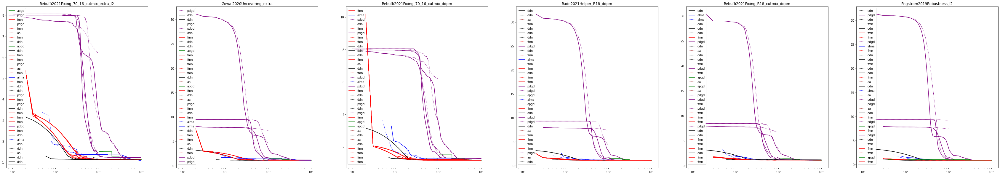

In [101]:
logger.plot_QD_grid(where_settings={"norm":"L2"}, figsize=(60,10))

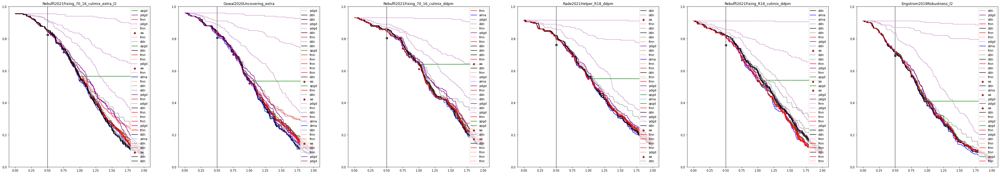

In [102]:
logger.plot_SE_grid(where_settings={"norm":"L2"}, figsize=(60,10))

### FMN investigation

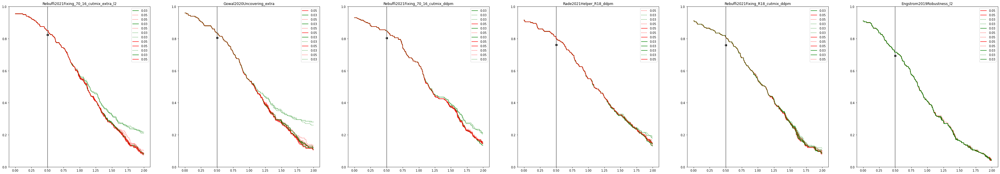

In [103]:
logger.plot_SE_grid(where_settings={"norm":"L2"}, figsize=(60,10), compare_on="γ_init")

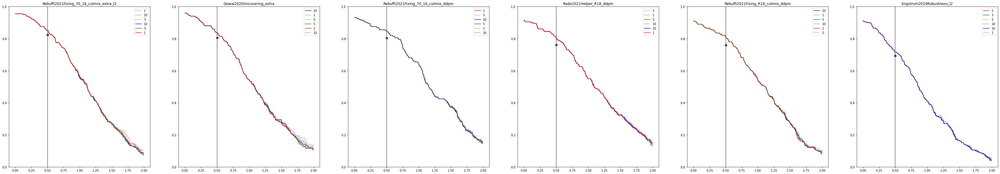

In [104]:
logger.plot_SE_grid(where_settings={"norm":"L2", "γ_init":0.05}, figsize=(60,10), compare_on="α_init")

### Observation of FMN in L2

- the gamma itit is clearly better 0.05
- all tried alpha inits seem to work almost the same 
- seleceted alpha=5

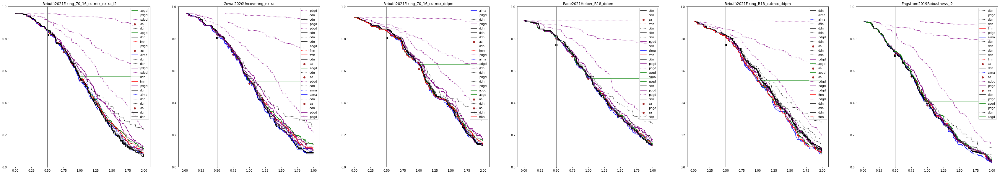

In [105]:
logger.plot_SE_grid(where_settings={"norm":"L2", "γ_init":0.05, "α_init":"5"}, figsize=(60,10))

### DDN investigation

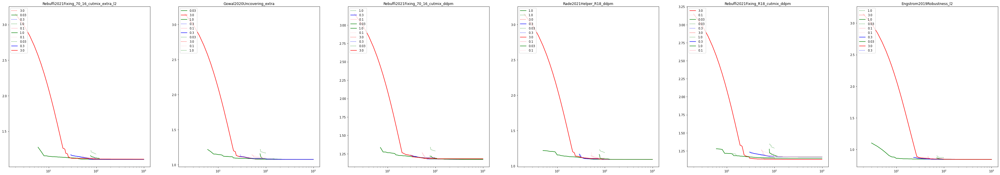

In [106]:
logger.plot_QD_grid(where_settings={"norm":"L2"}, figsize=(60,10), compare_on="init_norm")

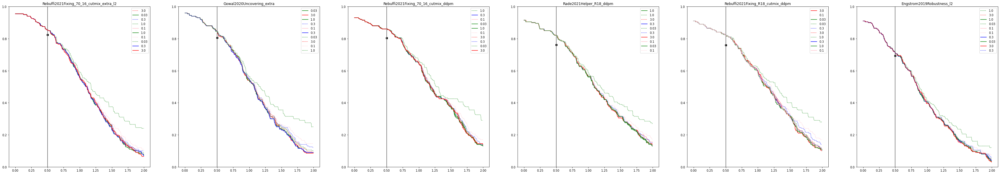

In [107]:
logger.plot_SE_grid(where_settings={"norm":"L2"}, figsize=(60,10), compare_on="init_norm")

### Observation of DDN L2
- init_norm = 3 seem to be the best 

### PDGD investigation

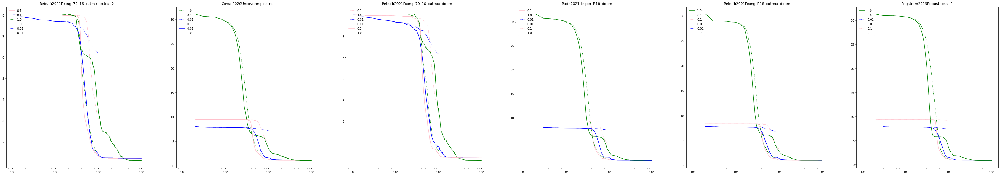

In [108]:
logger.plot_QD_grid(where_settings={"norm":"L2"}, figsize=(60,10), compare_on="primal_lr")

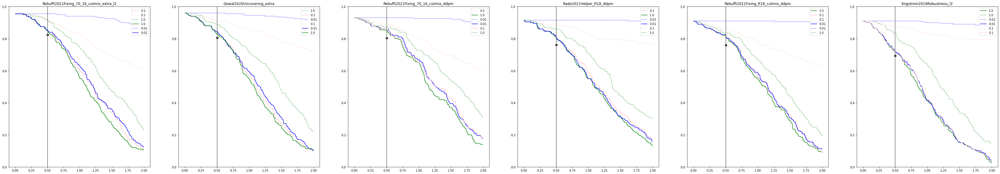

In [109]:
logger.plot_SE_grid(where_settings={"norm":"L2"}, figsize=(60,10), compare_on="primal_lr")

### Observation of PGPD in L2
- primal lr = 1 is clearly the best for 100 steps
- primal lr = 1 seem to be the best also for 1000, but all lr perform rather the same

In [114]:
optimal_l2_settings = {"norm":"L2", "α_init":"5", "γ_init":0.05, "init_norm":3, "primal_lr":1}

In [119]:
report = logger.report(logger.where(**optimal_l2_settings))
report.reset_index(drop=True)
report = report[report.attack != "aa"]
# apgd step overflow hack
report.steps = report.steps.replace(1021, 1001)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/utils/metrics.py:109: RuntimeWarning: divide by zero encountered in float_scalars


In [120]:
# assure that all attacks has the same number of runs
# assert (report.attack.value_counts() == report.attack.value_counts()[0]).all()

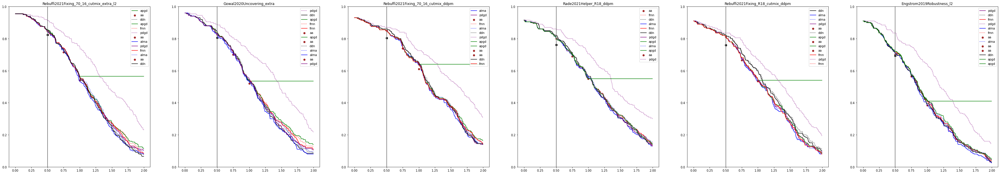

In [121]:
logger.plot_SE_grid(where_settings=optimal_l2_settings, figsize=(60,10))

## Observation

- ALMA seems to be superior in L2

## Fair params results

In [122]:
pd.DataFrame(report.groupby(["steps", "model", "attack"])["median"].min())

median
steps model                                   attack          
101   Engstrom2019Robustness_l2               alma    0.854797
                                              ddn     0.850809
                                              fmn     0.861689
                                              pdgd    1.193495
      Gowal2020Uncovering_extra               alma    1.080440
                                              ddn     1.084262
                                              fmn     1.088727
                                              pdgd    1.471488
      Rade2021Helper_R18_ddpm                 alma    1.102878
                                              ddn     1.105090
                                              fmn     1.088176
                                              pdgd    1.376102
      Rebuffi2021Fixing_70_16_cutmix_ddpm     alma    1.161206
                                              ddn     1.193106
                                              fmn     1.155596
                                              pdgd    1.618035
      Rebuffi2021Fixing_70_16_cutmix_extra_l2 alma    1.131801
                                              ddn     1.116779
                                              fmn     1.115487
                                              pdgd    1.445786
      Rebuffi2021Fixing_R18_cutmix_ddpm       alma    1.127453
                                              ddn     1.135973
                                              fmn     1.113560
                                              pdgd    1.389592
1001  Engstrom2019Robustness_l2               alma    0.840594
                                              apgd    0.866640
                                              ddn     0.843445
                                              fmn     0.861531
                                              pdgd    0.856607
      Gowal2020Uncovering_extra               alma    1.065729
                                              apgd    1.090659
                                              ddn     1.074370
                                              fmn     1.079848
                                              pdgd    1.078274
      Rade2021Helper_R18_ddpm                 alma    1.089069
                                              apgd    1.088867
                                              ddn     1.090915
                                              fmn     1.088148
                                              pdgd    1.089271
      Rebuffi2021Fixing_70_16_cutmix_ddpm     alma    1.154684
                                              apgd    1.163086
                                              ddn     1.182092
                                              fmn     1.155430
                                              pdgd    1.155404
      Rebuffi2021Fixing_70_16_cutmix_extra_l2 alma    1.081050
                                              apgd    1.121094
                                              ddn     1.108453
                                              fmn     1.113039
                                              pdgd    1.110423
      Rebuffi2021Fixing_R18_cutmix_ddpm       alma    1.062572
                                              apgd    1.085903
                                              ddn     1.129773
                                              fmn     1.113464
                                              pdgd    1.110773

In [123]:
pd.DataFrame(report.groupby(["steps", "attack", "model"])["n_qs"].min())

n_qs
steps attack model                                         
101   alma   Engstrom2019Robustness_l2                 42.0
             Gowal2020Uncovering_extra                 48.0
             Rade2021Helper_R18_ddpm                   47.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm       45.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2   50.0
             Rebuffi2021Fixing_R18_cutmix_ddpm         39.0
      ddn    Engstrom2019Robustness_l2                 26.0
             Gowal2020Uncovering_extra                 22.0
             Rade2021Helper_R18_ddpm                   21.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm       20.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2   23.0
             Rebuffi2021Fixing_R18_cutmix_ddpm         23.0
      fmn    Engstrom2019Robustness_l2                  8.0
             Gowal2020Uncovering_extra                 29.0
             Rade2021Helper_R18_ddpm                   13.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm       16.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2   27.0
             Rebuffi2021Fixing_R18_cutmix_ddpm         12.0
      pdgd   Engstrom2019Robustness_l2                 91.0
             Gowal2020Uncovering_extra                 86.0
             Rade2021Helper_R18_ddpm                   89.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm       89.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2   86.0
             Rebuffi2021Fixing_R18_cutmix_ddpm         91.0
1001  alma   Engstrom2019Robustness_l2                336.0
             Gowal2020Uncovering_extra                454.0
             Rade2021Helper_R18_ddpm                   41.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm       44.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  485.0
             Rebuffi2021Fixing_R18_cutmix_ddpm        334.0
      apgd   Engstrom2019Robustness_l2                249.0
             Gowal2020Uncovering_extra                  0.0
             Rade2021Helper_R18_ddpm                    0.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm        0.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2    0.0
             Rebuffi2021Fixing_R18_cutmix_ddpm          0.0
      ddn    Engstrom2019Robustness_l2                 27.0
             Gowal2020Uncovering_extra                 24.0
             Rade2021Helper_R18_ddpm                   22.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm       20.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2   23.0
             Rebuffi2021Fixing_R18_cutmix_ddpm         23.0
      fmn    Engstrom2019Robustness_l2                  8.0
             Gowal2020Uncovering_extra                 27.0
             Rade2021Helper_R18_ddpm                   13.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm       16.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2   26.0
             Rebuffi2021Fixing_R18_cutmix_ddpm         12.0
      pdgd   Engstrom2019Robustness_l2                359.0
             Gowal2020Uncovering_extra                388.0
             Rade2021Helper_R18_ddpm                  293.0
             Rebuffi2021Fixing_70_16_cutmix_ddpm      296.0
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  378.0
             Rebuffi2021Fixing_R18_cutmix_ddpm        260.0

In [124]:
pd.DataFrame(report.groupby(["steps", "attack", "model"])["asr"].max())

asr
steps attack model                                              
101   alma   Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000
      ddn    Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000
      fmn    Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000
      pdgd   Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000
1001  alma   Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000
      apgd   Engstrom2019Robustness_l2                 95.054945
             Gowal2020Uncovering_extra                 85.416667
             Rade2021Helper_R18_ddpm                   84.153005
             Rebuffi2021Fixing_70_16_cutmix_ddpm       82.258065
             Rebuffi2021Fixing_70_16_cutmix_extra_l2   87.958115
             Rebuffi2021Fixing_R18_cutmix_ddpm         91.758242
      ddn    Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000
      fmn    Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000
      pdgd   Engstrom2019Robustness_l2                100.000000
             Gowal2020Uncovering_extra                100.000000
             Rade2021Helper_R18_ddpm                  100.000000
             Rebuffi2021Fixing_70_16_cutmix_ddpm      100.000000
             Rebuffi2021Fixing_70_16_cutmix_extra_l2  100.000000
             Rebuffi2021Fixing_R18_cutmix_ddpm        100.000000

## L1

In [131]:
report = logger.report(logger.where(norm="L1"))
report.reset_index(drop=True)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/utils/metrics.py:109: RuntimeWarning: divide by zero encountered in float_scalars


,dataset,norm,model,attack,steps,params,median,n_qs,asr,first_adv_step,first_last_ratio
0,CIFAR10,L1,Engstrom2019Robustness_l2,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,9.856852,37.0,92.307692,4.413978,1.721132
1,CIFAR10,L1,Engstrom2019Robustness_linf,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,4.904646,37.0,100.000000,5.950000,1.795902
2,CIFAR10,L1,Augustin2020Adversarial_34_10_extra,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,12.901966,44.0,100.000000,4.785000,2.829445
3,CIFAR10,L1,Engstrom2019Robustness_l2,pdpgd,101,-loss_f-DL-num_steps-100-primal_lr-0.1-random_...,13.519400,59.0,100.000000,1.640000,inf
4,CIFAR10,L1,Engstrom2019Robustness_l2,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,13.524501,561.0,59.340659,67.388889,1.716382
...,...,...,...,...,...,...,...,...,...,...,...
170,CIFAR10,L1,Maini2020MultipleAVG,apgd,1021,-binary_search_steps-10-loss_f-DL-max_eps-12.0...,14.273436,250.0,70.760235,105.313333,inf
171,CIFAR10,L1,Xiao2020Enhancing,pdpgd,101,-loss_f-DL-num_steps-100-primal_lr-0.1-random_...,18.464384,58.0,96.226415,23.742268,inf
172,CIFAR10,L1,Augustin2020Adversarial_34_10_extra,pdpgd,101,-loss_f-DL-num_steps-100-primal_lr-1.0-random_...,13.200737,44.0,100.000000,1.980000,75.028797
173,CIFAR10,L1,Augustin2020Adversarial_34_10_extra,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,13.020168,56.0,90.476190,8.351648,3.904801


## Best params results

In [132]:
import pandas as pd

In [133]:
report.groupby(["model", "attack"])["median"].min()

model                                attack
Augustin2020Adversarial_34_10_extra  aa        12.000001
                                     alma      12.479239
                                     apgd      13.218748
                                     fmn       11.785628
                                     pdpgd     12.222678
Engstrom2019Robustness_l2            aa         8.000001
                                     alma       8.648815
                                     apgd       8.789062
                                     fmn        8.648832
                                     pdpgd      8.956768
Engstrom2019Robustness_linf          aa         8.000000
                                     alma       4.681203
                                     apgd       5.308593
                                     fmn        4.837385
                                     pdpgd      4.094135
Maini2020MultipleAVG                 aa        18.000000
                                     alma   

In [134]:
report.groupby(["attack", "model"])["n_qs"].min()

attack  model                              
aa      Augustin2020Adversarial_34_10_extra      0.0
        Engstrom2019Robustness_l2                1.0
        Engstrom2019Robustness_linf              1.0
        Maini2020MultipleAVG                     0.0
        Maini2020MultipleMSD                     0.0
        Rice2020Overfitting                      1.0
        Xiao2020Enhancing                        1.0
alma    Augustin2020Adversarial_34_10_extra     77.0
        Engstrom2019Robustness_l2               70.0
        Engstrom2019Robustness_linf             82.0
        Maini2020MultipleAVG                    73.0
        Maini2020MultipleMSD                    71.0
        Rice2020Overfitting                     65.0
        Xiao2020Enhancing                       92.0
apgd    Augustin2020Adversarial_34_10_extra    370.0
        Engstrom2019Robustness_l2              337.0
        Engstrom2019Robustness_linf            255.0
        Maini2020MultipleAVG                   250.0
  

In [135]:
report.groupby(["attack", "model"])["asr"].max()

attack  model                              
aa      Augustin2020Adversarial_34_10_extra     76.719576
        Engstrom2019Robustness_l2               84.615384
        Engstrom2019Robustness_linf             97.790055
        Maini2020MultipleAVG                    61.403510
        Maini2020MultipleMSD                    56.626505
        Rice2020Overfitting                     86.413044
        Xiao2020Enhancing                       81.132075
alma    Augustin2020Adversarial_34_10_extra    100.000000
        Engstrom2019Robustness_l2              100.000000
        Engstrom2019Robustness_linf            100.000000
        Maini2020MultipleAVG                   100.000000
        Maini2020MultipleMSD                   100.000000
        Rice2020Overfitting                    100.000000
        Xiao2020Enhancing                      100.000000
apgd    Augustin2020Adversarial_34_10_extra     95.767196
        Engstrom2019Robustness_l2              100.000000
        Engstrom2019Robustne

## QD in L1

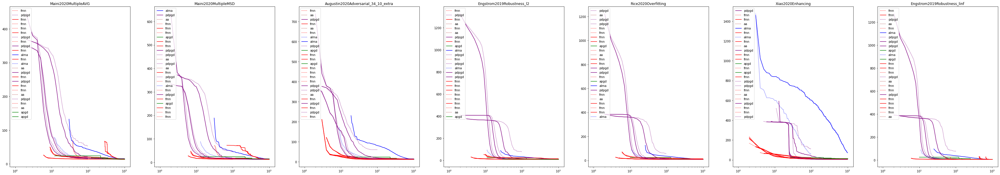

In [136]:
logger.plot_QD_grid(where_settings={"norm":"L1"}, figsize=(60,10))

### FMN in L1 

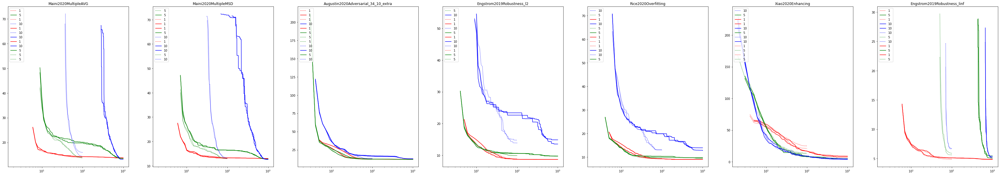

In [137]:
logger.plot_QD_grid(where_settings={"norm":"L1"}, figsize=(60,10), compare_on="α_init")

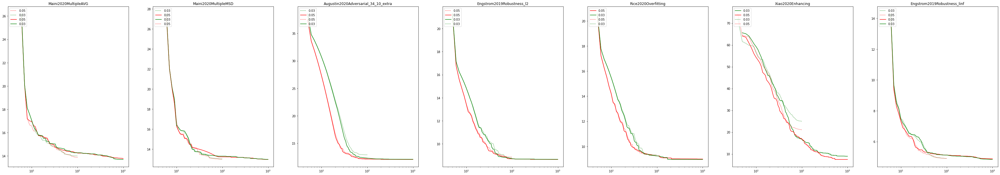

In [138]:
logger.plot_QD_grid(where_settings={"norm":"L1", "α_init":"1-"}, figsize=(60,10), compare_on="γ_init")

### PDPGD in L1 

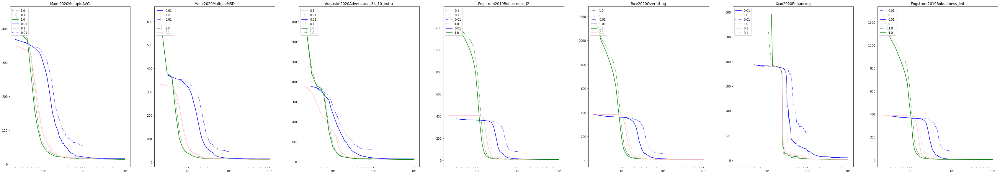

In [139]:
logger.plot_QD_grid(where_settings={"norm":"L1"}, figsize=(60,10), compare_on="primal_lr")

## Observation of QD in L1
- FMN clearly outpreforms ALMA in QD AUC (**BUT** this may be only because ALMA is not designed to have good QD)
- Crucial hyperparam in aplha_init where from [1,3,10] 1 works the best
- not much influential was gamma_init, which is better in case gamma = 0.05 than 0.03

- Note that NO hyperparams search was done for ALMA
- FMN also outperforms APGDL1 in terms of QD (same case as for ALMA)  

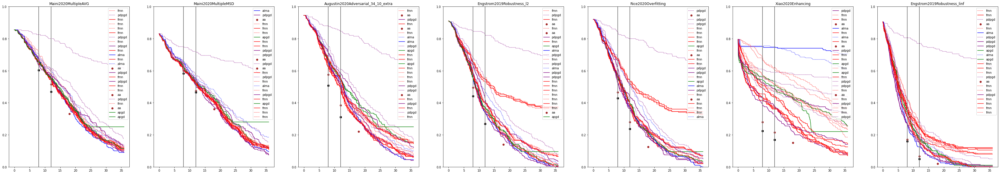

In [140]:
logger.plot_SE_grid(where_settings={"norm":"L1"}, figsize=(60,10))

### FMN in L1 

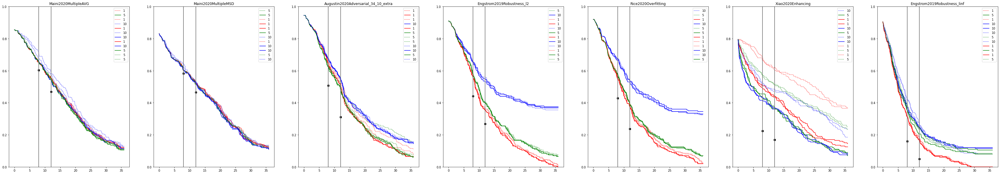

In [141]:
logger.plot_SE_grid(where_settings={"norm":"L1"}, figsize=(60,10), compare_on="α_init")

### PDPGD in L1 

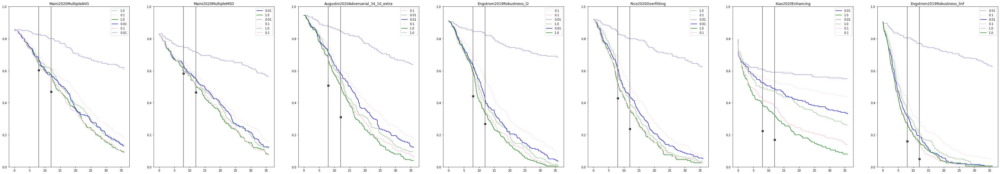

In [142]:
logger.plot_SE_grid(where_settings={"norm":"L1"}, figsize=(60,10), compare_on="primal_lr")

### APGD in L1 

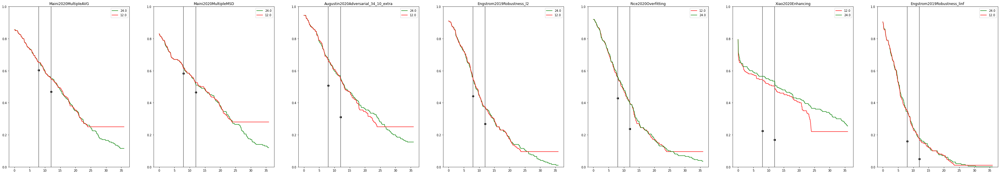

In [143]:
logger.plot_SE_grid(where_settings={"norm":"L1"}, figsize=(60,10), compare_on="max_eps")

## Observation of SE in L1
- the best reported robust accuracies in L1 APGD paper are usually 5-20% lower than those reached by minimal norm attacks
- it seems that minimal APGD L1 works similarly to FMN
- on the lower Eps FMN outperforms ALMA, on the higher eps other way around
- crucial parameter for FMN in L1 is aplha_init - out of [1,3, 10], the 1 is clearly superior
- ALMA 100 steps and 1000 steps version makes "a cross" (100 steps works better for lower eps, 1000 steps works better for higher eps)
- PDPGD seem to work best with primal_lr=1
- minimal APGD can be initiated well to show entire SE curve - 24 in L1

- Special case: Xiaio2020 seems to be parituclalry special one (FMN works the best though)


- Note that NO hyperparams search was done for ALMA


In [144]:
optimal_l1_settings = {"norm":"L1", "α_init":"1-", "γ_init":0.05, "primal_lr":1, "max_eps":24}

## Fair comparison (fixed hyperparams)

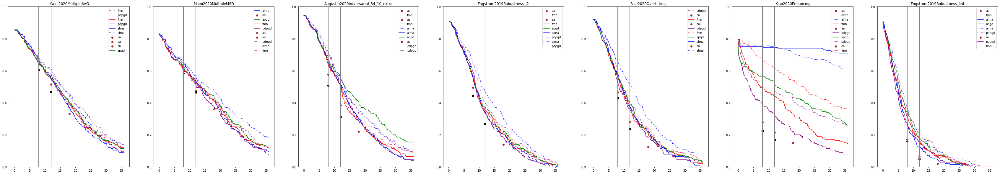

In [145]:
logger.plot_SE_grid(where_settings=optimal_l1_settings, figsize=(60,10))

In [146]:
report = logger.report(logger.where(**optimal_l1_settings))
report.reset_index(drop=True)
report = report[report.attack != "aa"]

# apgd step overflow hack
report.steps = report.steps.replace(1021, 1001)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/utils/metrics.py:109: RuntimeWarning: divide by zero encountered in float_scalars


In [147]:
# assure that all attacks has the same number of runs (apgd not run for 100 steps now)
assert (report.attack[report.attack != "apgd"].value_counts() == report.attack.value_counts()[0]).all()

## Fair params results

In [148]:
import pandas as pd

In [149]:
pd.DataFrame(report.groupby(["steps", "model", "attack"])["median"].min())

median
steps model                               attack           
101   Augustin2020Adversarial_34_10_extra alma    13.549002
                                          fmn     12.234554
                                          pdpgd   13.200737
      Engstrom2019Robustness_l2           alma    10.882883
                                          fmn      8.855440
                                          pdpgd   10.022188
      Engstrom2019Robustness_linf         alma     5.848069
                                          fmn      4.906054
                                          pdpgd    5.530396
      Maini2020MultipleAVG                alma    15.567286
                                          fmn     13.883930
                                          pdpgd   15.463324
      Maini2020MultipleMSD                alma    15.789997
                                          fmn     13.003996
                                          pdpgd   13.726015
      Rice2020Overfitting                 alma    12.456904
                                          fmn      9.322211
                                          pdpgd    9.650131
      Xiao2020Enhancing                   alma    59.283749
                                          fmn     21.113441
                                          pdpgd    7.184968
1001  Augustin2020Adversarial_34_10_extra alma    12.479239
                                          apgd    13.335938
                                          fmn     12.054079
                                          pdpgd   12.222678
      Engstrom2019Robustness_l2           alma     8.648815
                                          apgd     8.789062
                                          fmn      8.648832
                                          pdpgd    8.956768
      Engstrom2019Robustness_linf         alma     4.681203
                                          apgd     5.531249
                                          fmn      4.881136
                                          pdpgd    4.094135
      Maini2020MultipleAVG                alma    13.831532
                                          apgd    14.367185
                                          fmn     13.786795
                                          pdpgd   13.544579
      Maini2020MultipleMSD                alma    13.640896
                                          apgd    13.289061
                                          fmn     12.968691
                                          pdpgd   12.183859
      Rice2020Overfitting                 alma     9.324327
                                          apgd     9.539062
                                          fmn      8.988445
                                          pdpgd    8.404005
      Xiao2020Enhancing                   alma    70.799400
                                          apgd    12.749997
                                          fmn      7.473476
                                          pdpgd    3.752219

In [150]:
pd.DataFrame(report.groupby(["steps", "attack", "model"])["n_qs"].min())

n_qs
steps attack model                                     
101   alma   Augustin2020Adversarial_34_10_extra   77.0
             Engstrom2019Robustness_l2             70.0
             Engstrom2019Robustness_linf           82.0
             Maini2020MultipleAVG                  73.0
             Maini2020MultipleMSD                  71.0
             Rice2020Overfitting                   65.0
             Xiao2020Enhancing                     92.0
      fmn    Augustin2020Adversarial_34_10_extra   33.0
             Engstrom2019Robustness_l2             29.0
             Engstrom2019Robustness_linf           27.0
             Maini2020MultipleAVG                  24.0
             Maini2020MultipleMSD                  22.0
             Rice2020Overfitting                   27.0
             Xiao2020Enhancing                     56.0
      pdpgd  Augustin2020Adversarial_34_10_extra   44.0
             Engstrom2019Robustness_l2             49.0
             Engstrom2019Robustness_linf           52.0
             Maini2020MultipleAVG                  59.0
             Maini2020MultipleMSD                  40.0
             Rice2020Overfitting                   50.0
             Xiao2020Enhancing                     72.0
1001  alma   Augustin2020Adversarial_34_10_extra  853.0
             Engstrom2019Robustness_l2            812.0
             Engstrom2019Robustness_linf          904.0
             Maini2020MultipleAVG                 708.0
             Maini2020MultipleMSD                 797.0
             Rice2020Overfitting                  746.0
             Xiao2020Enhancing                    967.0
      apgd   Augustin2020Adversarial_34_10_extra  470.0
             Engstrom2019Robustness_l2            361.0
             Engstrom2019Robustness_linf          255.0
             Maini2020MultipleAVG                 348.0
             Maini2020MultipleMSD                 458.0
             Rice2020Overfitting                  567.0
             Xiao2020Enhancing                    470.0
      fmn    Augustin2020Adversarial_34_10_extra   32.0
             Engstrom2019Robustness_l2             30.0
             Engstrom2019Robustness_linf           31.0
             Maini2020MultipleAVG                  25.0
             Maini2020MultipleMSD                  22.0
             Rice2020Overfitting                   33.0
             Xiao2020Enhancing                    452.0
      pdpgd  Augustin2020Adversarial_34_10_extra  231.0
             Engstrom2019Robustness_l2            264.0
             Engstrom2019Robustness_linf          243.0
             Maini2020MultipleAVG                 268.0
             Maini2020MultipleMSD                 297.0
             Rice2020Overfitting                  261.0
             Xiao2020Enhancing                    340.0

In [151]:
pd.DataFrame(report.groupby(["steps", "attack", "model"])["asr"].max())

asr
steps attack model                                          
101   alma   Augustin2020Adversarial_34_10_extra  100.000000
             Engstrom2019Robustness_l2            100.000000
             Engstrom2019Robustness_linf          100.000000
             Maini2020MultipleAVG                 100.000000
             Maini2020MultipleMSD                 100.000000
             Rice2020Overfitting                  100.000000
             Xiao2020Enhancing                    100.000000
      fmn    Augustin2020Adversarial_34_10_extra  100.000000
             Engstrom2019Robustness_l2            100.000000
             Engstrom2019Robustness_linf          100.000000
             Maini2020MultipleAVG                 100.000000
             Maini2020MultipleMSD                 100.000000
             Rice2020Overfitting                  100.000000
             Xiao2020Enhancing                    100.000000
      pdpgd  Augustin2020Adversarial_34_10_extra  100.000000
             Engstrom2019Robustness_l2            100.000000
             Engstrom2019Robustness_linf          100.000000
             Maini2020MultipleAVG                 100.000000
             Maini2020MultipleMSD                 100.000000
             Rice2020Overfitting                  100.000000
             Xiao2020Enhancing                    100.000000
1001  alma   Augustin2020Adversarial_34_10_extra  100.000000
             Engstrom2019Robustness_l2            100.000000
             Engstrom2019Robustness_linf          100.000000
             Maini2020MultipleAVG                 100.000000
             Maini2020MultipleMSD                 100.000000
             Rice2020Overfitting                  100.000000
             Xiao2020Enhancing                    100.000000
      apgd   Augustin2020Adversarial_34_10_extra   95.767196
             Engstrom2019Robustness_l2            100.000000
             Engstrom2019Robustness_linf          100.000000
             Maini2020MultipleAVG                  95.906433
             Maini2020MultipleMSD                  90.963855
             Rice2020Overfitting                  100.000000
             Xiao2020Enhancing                     89.937107
      fmn    Augustin2020Adversarial_34_10_extra  100.000000
             Engstrom2019Robustness_l2            100.000000
             Engstrom2019Robustness_linf          100.000000
             Maini2020MultipleAVG                 100.000000
             Maini2020MultipleMSD                 100.000000
             Rice2020Overfitting                  100.000000
             Xiao2020Enhancing                    100.000000
      pdpgd  Augustin2020Adversarial_34_10_extra  100.000000
             Engstrom2019Robustness_l2            100.000000
             Engstrom2019Robustness_linf          100.000000
             Maini2020MultipleAVG                 100.000000
             Maini2020MultipleMSD                 100.000000
             Rice2020Overfitting                  100.000000
             Xiao2020Enhancing                    100.000000

# Conclusions

## Linf
- best hypeparams for FMN are unclear. The gamma_init is always better 0.05, but the aplha_init is complicated. The best seems to be 10, or 100. In the Adv library is default 1, so this may be replaced, but still, the difference in performance in small
- FMN is totally failing on Kang2021Stable model
- with these hypeparams FMN outperforms minimal APGD in minimal distance medians 
- also FMN is way better in n_qs to ocnverge - **BUT** this IS misleading!!!


## L2

## L1
- best hypeparams for FMN are aplha_init = 1 and gamma_init = 0.05 -> THESE ARE THE SAME AS THE DEFAULT ones in Adv library
- with these hypeparams FMN outperforms both ALMA and minimal APGD in minimal distance medians 
- also FMN is way better in n_qs to ocnverge - **BUT** this may be misleading!!!
- Xiao2020 is behaving differently - check out the defense mechanism
- FMN founds significantly better adversaries in 100 steps than ALMA in 100 steps


## Experiment with ensembling multiple minimum norm attacks

In [ ]:
from scores import SCORES

norm = "L1"
## add ensemble for L1:
for model_name in SCORES[norm][0]:
    run_ids = [*filter( lambda x: "attack-aa" not in x and "attack-apgd", list(logger.where(model=model_name, **optimal_l1_settings).keys()))]
    is_slow = lambda x: logger.get_n_steps(x) > 999
    quick_ids = [*filter(lambda x: not is_slow(x), run_ids)]
    slow_ids = [*filter(is_slow, run_ids)]
    
    if "Xiao" in model_name:
        continue
    logger.merge(f"dataset-CIFAR10-norm-{norm}-attack-ensemble-model-{model_name}-steps-1001", slow_ids)
    logger.merge(f"dataset-CIFAR10-norm-{norm}-attack-ensemble-model-{model_name}-steps-101", quick_ids)
    

In [ ]:
logger.plot_SE_grid(where_settings={**optimal_l1_settings}, figsize=(60,10))

In [179]:
# TODO select best hyperparams
norm = "L2"
## add ensemble for L2:
for model_name in SCORES[norm][0]:
    run_ids = [*filter( lambda x: "attack-aa" not in x, list(logger.where(model=model_name, **optimal_l2_settings).keys()))]
    
    is_slow = lambda x: logger.get_n_steps(x) > 999
    quick_ids = [*filter(lambda x: not is_slow(x), run_ids)]
    slow_ids = [*filter(is_slow, run_ids)]
    
    logger.merge(f"dataset-CIFAR10-norm-{norm}-attack-ensemble-model-{model_name}-steps-1001", slow_ids)
    logger.merge(f"dataset-CIFAR10-norm-{norm}-attack-ensemble-model-{model_name}-steps-101", quick_ids)



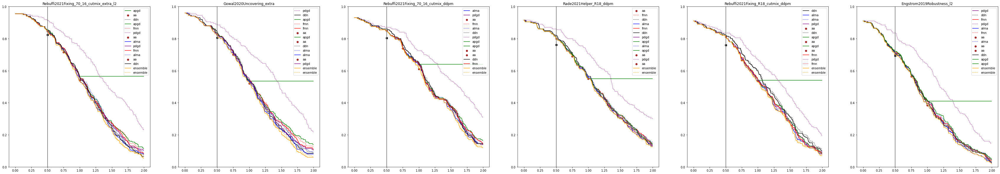

In [180]:
# TODO select best hyperparams
logger.plot_SE_grid(where_settings=optimal_l2_settings, figsize=(60,10))

In [181]:
norm = "Linf"
## add ensemble for Linf:
for model_name in SCORES[norm][0]:
    run_ids = [*filter( lambda x: "attack-aa" not in x, list(logger.where(model=model_name, **optimal_linf_settings).keys()))]
    
    is_slow = lambda x: logger.get_n_steps(x) > 999
    quick_ids = [*filter(lambda x: not is_slow(x), run_ids)]
    slow_ids = [*filter(is_slow, run_ids)]
    
    logger.merge(f"dataset-CIFAR10-norm-{norm}-attack-ensemble-model-{model_name}-steps-1001", slow_ids)
    logger.merge(f"dataset-CIFAR10-norm-{norm}-attack-ensemble-model-{model_name}-steps-101", quick_ids)


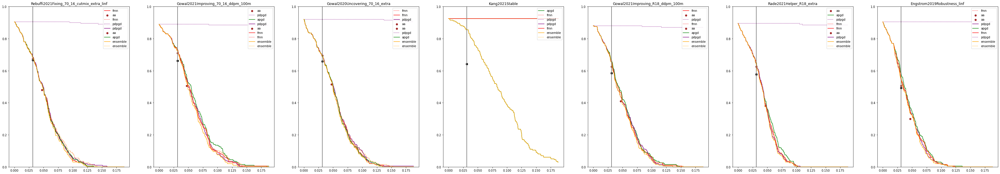

In [182]:
logger.plot_SE_grid(where_settings=optimal_linf_settings, figsize=(60,10))

## Experiment to inspect the initial behaviour

In [183]:
report = logger.report()
report.reset_index(drop=True)

/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/logging_.py:205: RuntimeWarning: Mean of empty slice
  first_last_ratio = np.nanmean(first_to_final_ratio(step_norms, step_accs))
/mnt/storage-brno6/home/xstary1/adversarial-ml-comparison/src/utils/metrics.py:109: RuntimeWarning: divide by zero encountered in float_scalars


,dataset,norm,model,attack,steps,params,median,n_qs,asr,first_adv_step,first_last_ratio
0,CIFAR10,L2,Engstrom2019Robustness_l2,ddn,101,-init_norm-1.0-loss_f-DL-steps-100-γ-0.05,0.844558,7.0,100.000000,5.395000,2.104891
1,CIFAR10,Linf,Rade2021Helper_R18_extra,aa,2,-eps-0.031373-loss_f-DL,inf,0.0,30.167598,0.720000,1.000000
2,CIFAR10,L2,Rebuffi2021Fixing_70_16_cutmix_ddpm,fmn,1001,-binary_search_steps-10-loss_f-DL-steps-1000-α...,1.155422,21.0,100.000000,2.365000,2.847995
3,CIFAR10,Linf,Engstrom2019Robustness_linf,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,0.035818,13.0,100.000000,2.805000,1.510797
4,CIFAR10,L1,Engstrom2019Robustness_l2,fmn,101,-binary_search_steps-10-loss_f-DL-steps-100-α_...,9.856852,37.0,92.307692,4.413978,1.721132
...,...,...,...,...,...,...,...,...,...,...,...
598,CIFAR10,Linf,Kang2021Stable,ensemble,101,-steps-101,0.964706,2.0,95.135135,2.151832,0.714967
599,CIFAR10,Linf,Engstrom2019Robustness_linf,ensemble,1021,-steps-1001,0.034539,17.0,100.000000,1.635000,15.790270
600,CIFAR10,Linf,Engstrom2019Robustness_linf,ensemble,101,-steps-101,0.035733,9.0,100.000000,1.685000,14.240876
601,CIFAR10,Linf,Gowal2021Improving_R18_ddpm_100m,ensemble,1021,-steps-1001,0.039627,17.0,100.000000,1.555000,8.373957


In [184]:
pd.DataFrame(report[report.attack == "fmn"].groupby(["norm", "steps", "model"])["first_adv_step"].mean())

first_adv_step
norm steps model                                                    
L1   101   Augustin2020Adversarial_34_10_extra              5.720059
           Engstrom2019Robustness_l2                        7.011137
           Engstrom2019Robustness_linf                     35.379132
           Maini2020MultipleAVG                            15.898128
           Maini2020MultipleMSD                            13.868130
           Rice2020Overfitting                              6.560212
           Xiao2020Enhancing                                3.244167
     1001  Augustin2020Adversarial_34_10_extra             17.810618
           Engstrom2019Robustness_l2                       23.607366
           Engstrom2019Robustness_linf                    296.529394
           Maini2020MultipleAVG                            94.551393
           Maini2020MultipleMSD                            84.110745
           Rice2020Overfitting                             17.277983
           Xiao2020Enhancing                                3.219167
L2   101   Engstrom2019Robustness_l2                        2.491667
           Gowal2020Uncovering_extra                        2.498333
           Rade2021Helper_R18_ddpm                          2.165000
           Rebuffi2021Fixing_70_16_cutmix_ddpm              2.398333
           Rebuffi2021Fixing_70_16_cutmix_extra_l2          2.226667
           Rebuffi2021Fixing_R18_cutmix_ddpm                2.536667
     1001  Engstrom2019Robustness_l2                        2.491667
           Gowal2020Uncovering_extra                        2.498333
           Rade2021Helper_R18_ddpm                          2.165000
           Rebuffi2021Fixing_70_16_cutmix_ddpm              2.398333
           Rebuffi2021Fixing_70_16_cutmix_extra_l2          2.226667
           Rebuffi2021Fixing_R18_cutmix_ddpm                2.535833
Linf 101   Engstrom2019Robustness_linf                      3.086250
           Gowal2020Uncovering_70_16_extra                  2.693125
           Gowal2021Improving_70_16_ddpm_100m               3.325000
           Gowal2021Improving_R18_ddpm_100m                 2.977500
           Kang2021Stable                                   0.000000
           Rade2021Helper_R18_extra                         2.561875
           Rebuffi2021Fixing_70_16_cutmix_extra_linf        2.775930
     1001  Engstrom2019Robustness_linf                      3.081250
           Gowal2020Uncovering_70_16_extra                  2.691875
           Gowal2021Improving_70_16_ddpm_100m               3.323750
           Gowal2021Improving_R18_ddpm_100m                 2.976250
           Kang2021Stable                                   0.000000
           Rade2021Helper_R18_extra                         2.562500
           Rebuffi2021Fixing_70_16_cutmix_extra_linf        2.861875

In [185]:
pd.DataFrame(report[report.attack == "alma"].groupby(["norm", "steps", "model"])["first_adv_step"].mean())

first_adv_step
norm steps model                                                  
L1   101   Augustin2020Adversarial_34_10_extra               8.820
           Engstrom2019Robustness_l2                        10.285
           Engstrom2019Robustness_linf                      10.655
           Maini2020MultipleAVG                             10.745
           Maini2020MultipleMSD                             11.445
           Rice2020Overfitting                              10.620
           Xiao2020Enhancing                                 2.565
     1001  Augustin2020Adversarial_34_10_extra              18.610
           Engstrom2019Robustness_l2                        26.245
           Engstrom2019Robustness_linf                      25.725
           Maini2020MultipleAVG                             29.210
           Maini2020MultipleMSD                             32.610
           Rice2020Overfitting                              26.715
           Xiao2020Enhancing                                 2.765
L2   101   Engstrom2019Robustness_l2                         4.675
           Gowal2020Uncovering_extra                         4.890
           Rade2021Helper_R18_ddpm                           4.705
           Rebuffi2021Fixing_70_16_cutmix_ddpm               4.880
           Rebuffi2021Fixing_70_16_cutmix_extra_l2           4.845
           Rebuffi2021Fixing_R18_cutmix_ddpm                 5.060
     1001  Engstrom2019Robustness_l2                         8.400
           Gowal2020Uncovering_extra                         8.385
           Rade2021Helper_R18_ddpm                           8.375
           Rebuffi2021Fixing_70_16_cutmix_ddpm               9.450
           Rebuffi2021Fixing_70_16_cutmix_extra_l2           8.625
           Rebuffi2021Fixing_R18_cutmix_ddpm                 9.825

In [186]:
pd.DataFrame(report[report.attack == "fmn"].groupby(["norm", "steps", "model"])["first_last_ratio"].mean())

first_last_ratio
norm steps model                                                      
L1   101   Augustin2020Adversarial_34_10_extra                3.448900
           Engstrom2019Robustness_l2                          1.799966
           Engstrom2019Robustness_linf                        1.486999
           Maini2020MultipleAVG                               1.518845
           Maini2020MultipleMSD                               1.432003
           Rice2020Overfitting                                1.841243
           Xiao2020Enhancing                                 31.264399
     1001  Augustin2020Adversarial_34_10_extra                3.809885
           Engstrom2019Robustness_l2                          1.842508
           Engstrom2019Robustness_linf                        1.635751
           Maini2020MultipleAVG                               1.625547
           Maini2020MultipleMSD                               1.483594
           Rice2020Overfitting                                1.897905
           Xiao2020Enhancing                              19902.622530
L2   101   Engstrom2019Robustness_l2                          1.459274
           Gowal2020Uncovering_extra                          3.420536
           Rade2021Helper_R18_ddpm                            2.231297
           Rebuffi2021Fixing_70_16_cutmix_ddpm                2.613248
           Rebuffi2021Fixing_70_16_cutmix_extra_l2            3.359151
           Rebuffi2021Fixing_R18_cutmix_ddpm                  2.014197
     1001  Engstrom2019Robustness_l2                          1.463139
           Gowal2020Uncovering_extra                          3.905206
           Rade2021Helper_R18_ddpm                            2.324116
           Rebuffi2021Fixing_70_16_cutmix_ddpm                2.834260
           Rebuffi2021Fixing_70_16_cutmix_extra_l2            3.714667
           Rebuffi2021Fixing_R18_cutmix_ddpm                  2.049693
Linf 101   Engstrom2019Robustness_linf                        1.595724
           Gowal2020Uncovering_70_16_extra                    2.514624
           Gowal2021Improving_70_16_ddpm_100m                 1.891721
           Gowal2021Improving_R18_ddpm_100m                   1.570906
           Kang2021Stable                                          NaN
           Rade2021Helper_R18_extra                           1.846799
           Rebuffi2021Fixing_70_16_cutmix_extra_linf          2.787308
     1001  Engstrom2019Robustness_linf                        1.648517
           Gowal2020Uncovering_70_16_extra                    2.698721
           Gowal2021Improving_70_16_ddpm_100m                 2.011181
           Gowal2021Improving_R18_ddpm_100m                   1.624791
           Kang2021Stable                                          NaN
           Rade2021Helper_R18_extra                           1.922880
           Rebuffi2021Fixing_70_16_cutmix_extra_linf          3.083993

In [187]:
pd.DataFrame(report[report.attack == "alma"].groupby(["norm", "steps", "model"])["first_last_ratio"].mean())

first_last_ratio
norm steps model                                                    
L1   101   Augustin2020Adversarial_34_10_extra              8.451487
           Engstrom2019Robustness_l2                        4.959093
           Engstrom2019Robustness_linf                      9.859750
           Maini2020MultipleAVG                             4.907674
           Maini2020MultipleMSD                             6.200498
           Rice2020Overfitting                              5.247335
           Xiao2020Enhancing                               23.622737
     1001  Augustin2020Adversarial_34_10_extra             10.827771
           Engstrom2019Robustness_l2                        5.841907
           Engstrom2019Robustness_linf                     11.550635
           Maini2020MultipleAVG                             4.672062
           Maini2020MultipleMSD                             5.496874
           Rice2020Overfitting                              6.152480
           Xiao2020Enhancing                               14.310823
L2   101   Engstrom2019Robustness_l2                        2.232831
           Gowal2020Uncovering_extra                        4.837624
           Rade2021Helper_R18_ddpm                          2.748731
           Rebuffi2021Fixing_70_16_cutmix_ddpm              3.215073
           Rebuffi2021Fixing_70_16_cutmix_extra_l2          4.075064
           Rebuffi2021Fixing_R18_cutmix_ddpm                2.550681
     1001  Engstrom2019Robustness_l2                        1.779858
           Gowal2020Uncovering_extra                        2.984162
           Rade2021Helper_R18_ddpm                          2.085675
           Rebuffi2021Fixing_70_16_cutmix_ddpm              2.045289
           Rebuffi2021Fixing_70_16_cutmix_extra_l2          2.976712
           Rebuffi2021Fixing_R18_cutmix_ddpm                1.717831